In [0]:
import pandas as pd
df = pd.read_csv("telco.csv")

In [0]:
# Convert pandas DataFrame to Spark DataFrame
spark_df = spark.createDataFrame(df)

# Register as temp view
spark_df.createOrReplaceTempView("telco_raw")

# Clean numeric columns and create a new temp view
spark.sql(
    """
    CREATE OR REPLACE TEMP VIEW telco_clean AS
    SELECT
        *,
        try_cast(NULLIF(trim(tenure), '') AS DOUBLE) AS tenure_num,
        try_cast(NULLIF(trim(MonthlyCharges), '') AS DOUBLE) AS MonthlyCharges_num,
        try_cast(NULLIF(trim(TotalCharges), '') AS DOUBLE) AS TotalCharges_num
    FROM telco_raw
    """
)

DataFrame[]

In [0]:
# Step 3: Remove leading/trailing spaces and handle empty strings in numeric columns
spark.sql(
    """
    CREATE OR REPLACE TEMP VIEW telco_clean AS
    SELECT
        *,
        try_cast(NULLIF(trim(tenure), '') AS DOUBLE) AS tenure_num,
        try_cast(NULLIF(trim(MonthlyCharges), '') AS DOUBLE) AS MonthlyCharges_num,
        try_cast(NULLIF(trim(TotalCharges), '') AS DOUBLE) AS TotalCharges_num
    FROM telco_raw
    """
)

DataFrame[]

In [0]:
# Step 4: Display the cleaned Spark DataFrame
display(spark.sql("SELECT * FROM telco_clean"))

customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,tenure_num,MonthlyCharges_num,TotalCharges_num
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1.0,29.85,29.85
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No,34.0,56.95,1889.5
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,2.0,53.85,108.15
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.3,1840.75,No,45.0,42.3,1840.75
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.7,151.65,Yes,2.0,70.7,151.65
9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,8.0,99.65,820.5
1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.1,1949.4,No,22.0,89.1,1949.4
6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No,10.0,29.75,301.9
7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.8,3046.05,Yes,28.0,104.8,3046.05
6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No,62.0,56.15,3487.95


In [0]:
from pyspark.sql import functions as F

# Calculate means for numeric columns
means = spark.sql(
    """
    SELECT
        AVG(tenure_num) AS tenure_mean,
        AVG(MonthlyCharges_num) AS monthlycharges_mean,
        AVG(TotalCharges_num) AS totalcharges_mean
    FROM telco_clean
    """
).collect()[0]

# Fill missing numeric values with means
telco_filled = spark.sql("SELECT * FROM telco_clean") \
    .fillna(
        {
            "tenure_num": means["tenure_mean"],
            "MonthlyCharges_num": means["monthlycharges_mean"],
            "TotalCharges_num": means["totalcharges_mean"]
        }
    )

# Fill missing categorical values with 'Unknown'
categorical_cols = ["gender", "Partner", "Dependents", "PhoneService", "MultipleLines",
                    "InternetService", "OnlineSecurity", "OnlineBackup", "DeviceProtection",
                    "TechSupport", "StreamingTV", "StreamingMovies", "Contract",
                    "PaperlessBilling", "PaymentMethod", "Churn"]

telco_filled = telco_filled.fillna("Unknown", subset=categorical_cols)

display(telco_filled)

customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,tenure_num,MonthlyCharges_num,TotalCharges_num
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1.0,29.85,29.85
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No,34.0,56.95,1889.5
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,2.0,53.85,108.15
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.3,1840.75,No,45.0,42.3,1840.75
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.7,151.65,Yes,2.0,70.7,151.65
9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,8.0,99.65,820.5
1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.1,1949.4,No,22.0,89.1,1949.4
6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No,10.0,29.75,301.9
7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.8,3046.05,Yes,28.0,104.8,3046.05
6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No,62.0,56.15,3487.95


In [0]:
# Verify telco_final exists
try:
    print("✅ telco_final record count:", telco_final.count())
    print("✅ telco_final columns:", telco_final.columns)
except NameError:
    print("❌ telco_final not found — please rerun feature assembly + label indexer cells.")


❌ telco_final not found — please rerun feature assembly + label indexer cells.


In [0]:
from pyspark.ml.feature import StringIndexer, VectorAssembler

# ====================================================
# ✅ Feature Indexing and Assembly
# ====================================================

# 1️⃣ Index all categorical columns
indexers = [
    StringIndexer(inputCol=col, outputCol=col + "_idx").fit(telco_filled)
    for col in categorical_cols
]

for indexer in indexers:
    telco_filled = indexer.transform(telco_filled)

# 2️⃣ Assemble numeric + indexed categorical features
feature_cols = [
    "tenure_num", "MonthlyCharges_num", "TotalCharges_num"
] + [col + "_idx" for col in categorical_cols if col != "Churn"]

assembler = VectorAssembler(inputCols=feature_cols, outputCol="features")
telco_assembled = assembler.transform(telco_filled)

# 3️⃣ Index label column ("Churn")
label_indexer = StringIndexer(inputCol="Churn", outputCol="label").fit(telco_assembled)
telco_final = label_indexer.transform(telco_assembled)

# 4️⃣ Quick verification
print("✅ telco_final successfully created!")
print("Total rows:", telco_final.count())
print("Columns:", telco_final.columns)


✅ telco_final successfully created!
Total rows: 7043
Columns: ['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn', 'tenure_num', 'MonthlyCharges_num', 'TotalCharges_num', 'gender_idx', 'Partner_idx', 'Dependents_idx', 'PhoneService_idx', 'MultipleLines_idx', 'InternetService_idx', 'OnlineSecurity_idx', 'OnlineBackup_idx', 'DeviceProtection_idx', 'TechSupport_idx', 'StreamingTV_idx', 'StreamingMovies_idx', 'Contract_idx', 'PaperlessBilling_idx', 'PaymentMethod_idx', 'Churn_idx', 'features', 'label']


In [0]:

from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import pandas as pd

# =========================================
# 1️⃣ Train-test split (80–20)
# =========================================
train_df, test_df = telco_final.randomSplit([0.8, 0.2], seed=42)

# =========================================
# 2️⃣ Train Logistic Regression Model
# =========================================
lr = LogisticRegression(featuresCol="features", labelCol="label")
lr_model = lr.fit(train_df)

# =========================================
# 3️⃣ Predict on Test Set
# =========================================
predictions = lr_model.transform(test_df)

✅ Logistic Regression - Test AUC: 0.8362
✅ Logistic Regression - Test Accuracy: 0.8120


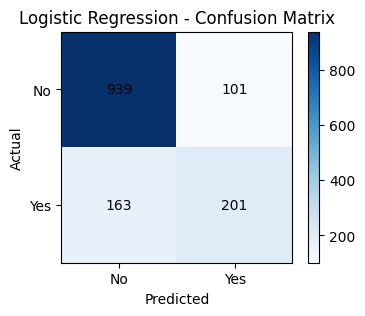

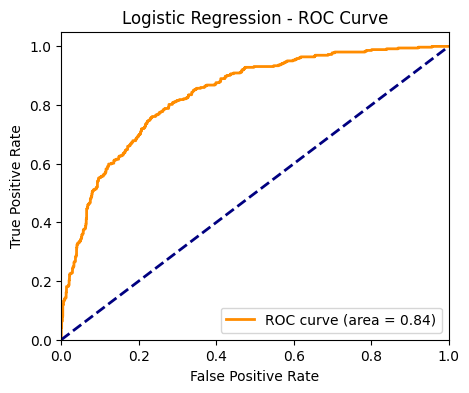

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc as sk_auc
import pandas as pd

# =========================================
# 4️⃣ Evaluation - AUC and Accuracy
# =========================================
# Binary evaluator for AUC
binary_eval = BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC")
test_auc = binary_eval.evaluate(predictions)

# Multiclass evaluator for Accuracy
multi_eval = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = multi_eval.evaluate(predictions)

print(f"✅ Logistic Regression - Test AUC: {test_auc:.4f}")
print(f"✅ Logistic Regression - Test Accuracy: {accuracy:.4f}")

# =========================================
# 5️⃣ Confusion Matrix
# =========================================
cm_df = predictions.groupBy("label", "prediction").count().toPandas().pivot(
    index="label", columns="prediction", values="count"
).fillna(0)

plt.figure(figsize=(4, 3))
plt.title("Logistic Regression - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.imshow(cm_df, cmap="Blues", interpolation="nearest")
plt.xticks([0, 1], ["No", "Yes"])
plt.yticks([0, 1], ["No", "Yes"])

# Add counts on each cell
for i in range(cm_df.shape[0]):
    for j in range(cm_df.shape[1]):
        plt.text(j, i, int(cm_df.iloc[i, j]), ha="center", va="center", color="black")
plt.colorbar()
plt.show()

# =========================================
# 6️⃣ ROC Curve
# =========================================
preds_pd = predictions.select("probability", "label").toPandas()
preds_pd["score"] = preds_pd["probability"].apply(lambda x: float(x[1]))

# Use renamed auc function to avoid conflicts
fpr, tpr, _ = roc_curve(preds_pd["label"], preds_pd["score"])
roc_auc_value = sk_auc(fpr, tpr)

plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_value:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression - ROC Curve")
plt.legend(loc="lower right")
plt.show()


In [0]:
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc as sk_auc
import pandas as pd

# =========================================
# 1️⃣ Train-test split (80–20)
# =========================================
train_df, test_df = telco_final.randomSplit([0.8, 0.2], seed=42)

# =========================================
# 2️⃣ Train Decision Tree Classifier
# =========================================
dt = DecisionTreeClassifier(featuresCol="features", labelCol="label", seed=42)
dt_model = dt.fit(train_df)

# =========================================
# 3️⃣ Predict on Test Set
# =========================================
predictions = dt_model.transform(test_df)

✅ Decision Tree - Test AUC: 0.7193
✅ Decision Tree - Test Accuracy: 0.7963


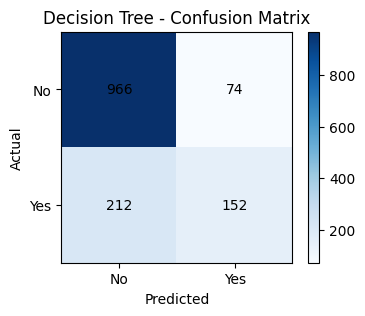

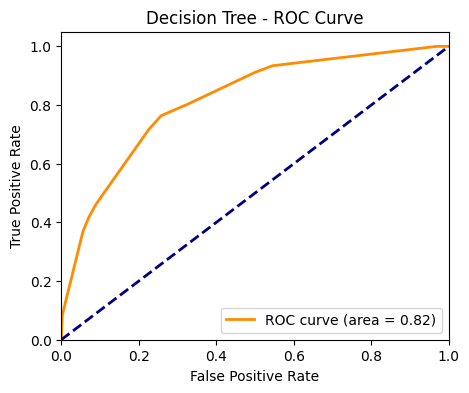

In [0]:
# =========================================
# 4️⃣ Evaluation - AUC and Accuracy
# =========================================
binary_eval = BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC")
test_auc = binary_eval.evaluate(predictions)

multi_eval = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = multi_eval.evaluate(predictions)

print(f"✅ Decision Tree - Test AUC: {test_auc:.4f}")
print(f"✅ Decision Tree - Test Accuracy: {accuracy:.4f}")

# =========================================
# 5️⃣ Confusion Matrix
# =========================================
cm_df = predictions.groupBy("label", "prediction").count().toPandas().pivot(
    index="label", columns="prediction", values="count"
).fillna(0)

plt.figure(figsize=(4, 3))
plt.title("Decision Tree - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.imshow(cm_df, cmap="Blues", interpolation="nearest")
plt.xticks([0, 1], ["No", "Yes"])
plt.yticks([0, 1], ["No", "Yes"])

for i in range(cm_df.shape[0]):
    for j in range(cm_df.shape[1]):
        plt.text(j, i, int(cm_df.iloc[i, j]), ha="center", va="center", color="black")
plt.colorbar()
plt.show()

# =========================================
# 6️⃣ ROC Curve
# =========================================
preds_pd = predictions.select("probability", "label").toPandas()
preds_pd["score"] = preds_pd["probability"].apply(lambda x: float(x[1]))

fpr, tpr, _ = roc_curve(preds_pd["label"], preds_pd["score"])
roc_auc_value = sk_auc(fpr, tpr)

plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_value:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Decision Tree - ROC Curve")
plt.legend(loc="lower right")
plt.show()

In [0]:
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc as sk_auc
import pandas as pd

# =========================================
# 1️⃣ Train-test split (80–20)
# =========================================
train_df, test_df = telco_final.randomSplit([0.8, 0.2], seed=42)

# =========================================
# 2️⃣ Train Random Forest Classifier
# =========================================
rf = RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=100, seed=42)
rf_model = rf.fit(train_df)

# =========================================
# 3️⃣ Predict on Test Set
# =========================================
predictions = rf_model.transform(test_df)

✅ Random Forest - Test AUC: 0.8349
✅ Random Forest - Test Accuracy: 0.7991


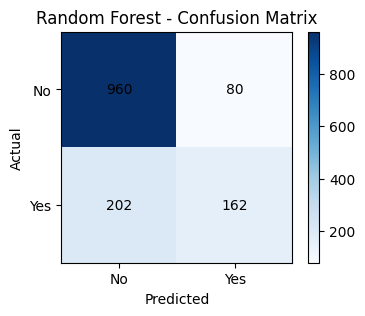

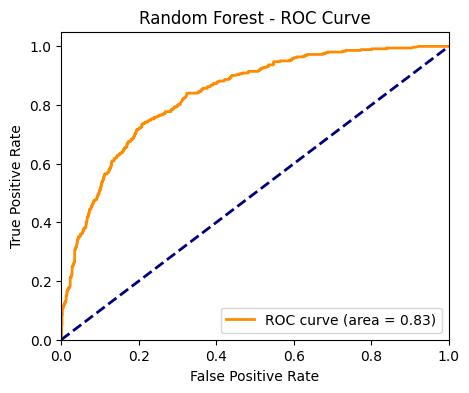

In [0]:

# =========================================
# 4️⃣ Evaluation - AUC and Accuracy
# =========================================
binary_eval = BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC")
test_auc = binary_eval.evaluate(predictions)

multi_eval = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = multi_eval.evaluate(predictions)

print(f"✅ Random Forest - Test AUC: {test_auc:.4f}")
print(f"✅ Random Forest - Test Accuracy: {accuracy:.4f}")

# =========================================
# 5️⃣ Confusion Matrix
# =========================================
cm_df = predictions.groupBy("label", "prediction").count().toPandas().pivot(
    index="label", columns="prediction", values="count"
).fillna(0)

plt.figure(figsize=(4, 3))
plt.title("Random Forest - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.imshow(cm_df, cmap="Blues", interpolation="nearest")
plt.xticks([0, 1], ["No", "Yes"])
plt.yticks([0, 1], ["No", "Yes"])

for i in range(cm_df.shape[0]):
    for j in range(cm_df.shape[1]):
        plt.text(j, i, int(cm_df.iloc[i, j]), ha="center", va="center", color="black")
plt.colorbar()
plt.show()

# =========================================
# 6️⃣ ROC Curve
# =========================================
preds_pd = predictions.select("probability", "label").toPandas()
preds_pd["score"] = preds_pd["probability"].apply(lambda x: float(x[1]))

fpr, tpr, _ = roc_curve(preds_pd["label"], preds_pd["score"])
roc_auc_value = sk_auc(fpr, tpr)

plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_value:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Random Forest - ROC Curve")
plt.legend(loc="lower right")
plt.show()

In [0]:
from pyspark.sql.functions import col, when, lit

# Compute class counts
total_count = telco_final.count()
pos_count = telco_final.filter(col("label") == 1).count()
neg_count = telco_final.filter(col("label") == 0).count()

# Weight = total / (2 * class_count)
telco_final = telco_final.withColumn(
    "classWeight",
    when(col("label") == 1, total_count / (2 * pos_count))
    .otherwise(total_count / (2 * neg_count))
)


In [0]:
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc as sk_auc
import pandas as pd

# =========================================
# 1️⃣ Train-test split (80–20)
# =========================================
train_df, test_df = telco_final.randomSplit([0.8, 0.2], seed=42)

# =========================================
# 2️⃣ Train GBT Classifier with tuned hyperparameters
# =========================================
gbt = GBTClassifier(
    featuresCol="features",
    labelCol="label",
    weightCol="classWeight",
    maxIter=200,       # Number of boosting iterations
    maxDepth=6,        # Depth of each tree
    stepSize=0.1,      # Learning rate
    seed=42
)
gbt_model = gbt.fit(train_df)

# =========================================
# 3️⃣ Predict on Test Set
# =========================================
predictions = gbt_model.transform(test_df)

✅ GBT Classifier - Test AUC: 0.8198
✅ GBT Classifier - Test Accuracy: 0.7600


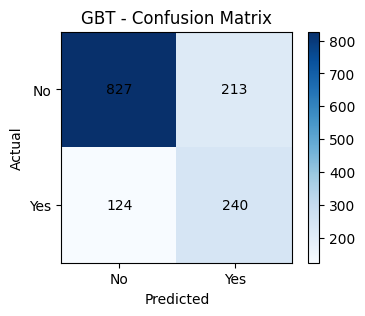

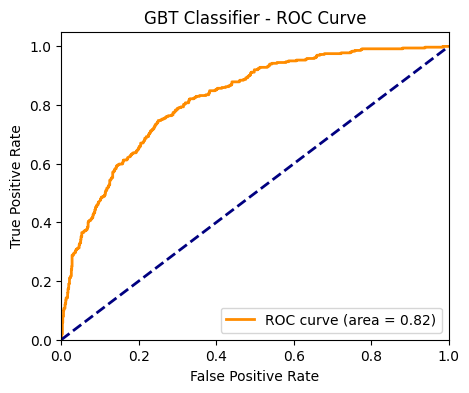

In [0]:
# =========================================
# 4️⃣ Evaluation - AUC and Accuracy
# =========================================
binary_eval = BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC")
test_auc = binary_eval.evaluate(predictions)

multi_eval = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = multi_eval.evaluate(predictions)

print(f"✅ GBT Classifier - Test AUC: {test_auc:.4f}")
print(f"✅ GBT Classifier - Test Accuracy: {accuracy:.4f}")

# =========================================
# 5️⃣ Confusion Matrix
# =========================================
cm_df = predictions.groupBy("label", "prediction").count().toPandas().pivot(
    index="label", columns="prediction", values="count"
).fillna(0)

plt.figure(figsize=(4, 3))
plt.title("GBT - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.imshow(cm_df, cmap="Blues", interpolation="nearest")
plt.xticks([0, 1], ["No", "Yes"])
plt.yticks([0, 1], ["No", "Yes"])

for i in range(cm_df.shape[0]):
    for j in range(cm_df.shape[1]):
        plt.text(j, i, int(cm_df.iloc[i, j]), ha="center", va="center", color="black")
plt.colorbar()
plt.show()

# =========================================
# 6️⃣ ROC Curve
# =========================================
preds_pd = predictions.select("probability", "label").toPandas()
preds_pd["score"] = preds_pd["probability"].apply(lambda x: float(x[1]))

fpr, tpr, _ = roc_curve(preds_pd["label"], preds_pd["score"])
roc_auc_value = sk_auc(fpr, tpr)

plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_value:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("GBT Classifier - ROC Curve")
plt.legend(loc="lower right")
plt.show()

✅ Voting Ensemble - Accuracy: 0.8056
✅ Voting Ensemble - F1-score: 0.5781
Confusion Matrix:
 [[944  96]
 [177 187]]


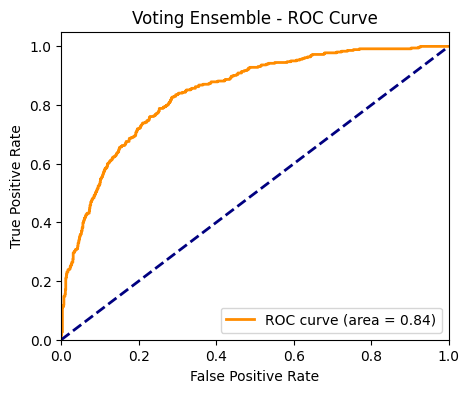

In [0]:
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier, GBTClassifier
from pyspark.ml.feature import VectorAssembler, StringIndexer
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.sql.functions import col
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc as sk_auc
import pandas as pd

# =========================================
# 1️⃣ Train-test split (80–20)
# =========================================
train_df, test_df = telco_final.randomSplit([0.8, 0.2], seed=42)

# =========================================
# 2️⃣ Train Base Models
# =========================================
# Logistic Regression
lr = LogisticRegression(featuresCol="features", labelCol="label", maxIter=100)
lr_model = lr.fit(train_df)
lr_preds = lr_model.transform(test_df).select("probability", "label")

# Random Forest
rf = RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=100, maxDepth=6, seed=42)
rf_model = rf.fit(train_df)
rf_preds = rf_model.transform(test_df).select("probability", "label")

# GBT
gbt = GBTClassifier(featuresCol="features", labelCol="label", maxIter=200, maxDepth=6, seed=42)
gbt_model = gbt.fit(train_df)
gbt_preds = gbt_model.transform(test_df).select("probability", "label")

# =========================================
# 3️⃣ Voting Ensemble - Average Probabilities
# =========================================
# Convert to Pandas for easy probability averaging
lr_pd = lr_preds.toPandas()
rf_pd = rf_preds.toPandas()
gbt_pd = gbt_preds.toPandas()

ensemble_pd = pd.DataFrame()
ensemble_pd["label"] = lr_pd["label"]
ensemble_pd["score"] = (lr_pd["probability"].apply(lambda x: float(x[1])) +
                         rf_pd["probability"].apply(lambda x: float(x[1])) +
                         gbt_pd["probability"].apply(lambda x: float(x[1]))) / 3

# Convert averaged probabilities to final prediction
ensemble_pd["prediction"] = ensemble_pd["score"].apply(lambda x: 1 if x >= 0.5 else 0)

# =========================================
# 4️⃣ Evaluation
# =========================================
# Accuracy & F1
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
accuracy = accuracy_score(ensemble_pd["label"], ensemble_pd["prediction"])
f1 = f1_score(ensemble_pd["label"], ensemble_pd["prediction"])
cm = confusion_matrix(ensemble_pd["label"], ensemble_pd["prediction"])
print(f"✅ Voting Ensemble - Accuracy: {accuracy:.4f}")
print(f"✅ Voting Ensemble - F1-score: {f1:.4f}")
print("Confusion Matrix:\n", cm)

# ROC & AUC
fpr, tpr, _ = roc_curve(ensemble_pd["label"], ensemble_pd["score"])
roc_auc_value = sk_auc(fpr, tpr)
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_value:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Voting Ensemble - ROC Curve")
plt.legend(loc="lower right")
plt.show()


In [0]:
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier, GBTClassifier
from pyspark.ml.feature import VectorAssembler, StringIndexer
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.sql import functions as F
import pandas as pd
from sklearn.linear_model import LogisticRegression as SklearnLR
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_curve, auc as sk_auc
import matplotlib.pyplot as plt

# =========================================
# 1️⃣ Train-test split (80–20)
# =========================================
train_df, test_df = telco_final.randomSplit([0.8, 0.2], seed=42)

# =========================================
# 2️⃣ Train Base Models
# =========================================
# Logistic Regression
lr = LogisticRegression(featuresCol="features", labelCol="label", maxIter=100)
lr_model = lr.fit(train_df)
lr_train_pred = lr_model.transform(train_df).select("probability", "label")
lr_test_pred = lr_model.transform(test_df).select("probability", "label")

# Random Forest
rf = RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=100, maxDepth=6, seed=42)
rf_model = rf.fit(train_df)
rf_train_pred = rf_model.transform(train_df).select("probability", "label")
rf_test_pred = rf_model.transform(test_df).select("probability", "label")

# GBT
gbt = GBTClassifier(featuresCol="features", labelCol="label", maxIter=200, maxDepth=6, seed=42)
gbt_model = gbt.fit(train_df)
gbt_train_pred = gbt_model.transform(train_df).select("probability", "label")
gbt_test_pred = gbt_model.transform(test_df).select("probability", "label")

# =========================================
# 3️⃣ Prepare Data for Meta-model (Stacking)
# =========================================
# Convert to Pandas for easier handling
train_pd = pd.DataFrame({
    "lr": lr_train_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "rf": rf_train_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "gbt": gbt_train_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "label": lr_train_pred.toPandas()["label"]
})

test_pd = pd.DataFrame({
    "lr": lr_test_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "rf": rf_test_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "gbt": gbt_test_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "label": lr_test_pred.toPandas()["label"]
})

# Features and labels for meta-model
X_train_meta = train_pd[["lr", "rf", "gbt"]]
y_train_meta = train_pd["label"]
X_test_meta = test_pd[["lr", "rf", "gbt"]]
y_test_meta = test_pd["label"]

# =========================================
# 4️⃣ Train Meta-model (Logistic Regression)
# =========================================
meta_model = SklearnLR()
meta_model.fit(X_train_meta, y_train_meta)

# Predictions
y_pred_prob = meta_model.predict_proba(X_test_meta)[:, 1]
y_pred = (y_pred_prob >= 0.5).astype(int)


✅ Stacking Ensemble - Accuracy: 0.7671
✅ Stacking Ensemble - F1-score: 0.5308
Confusion Matrix:
 [[892 148]
 [179 185]]


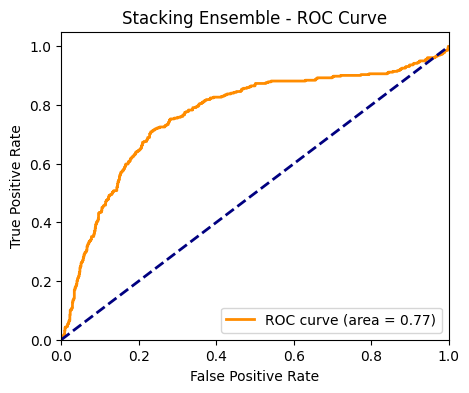

In [0]:
# =========================================
# 5️⃣ Evaluation
# =========================================
accuracy = accuracy_score(y_test_meta, y_pred)
f1 = f1_score(y_test_meta, y_pred)
cm = confusion_matrix(y_test_meta, y_pred)
fpr, tpr, _ = roc_curve(y_test_meta, y_pred_prob)
roc_auc_value = sk_auc(fpr, tpr)

print(f"✅ Stacking Ensemble - Accuracy: {accuracy:.4f}")
print(f"✅ Stacking Ensemble - F1-score: {f1:.4f}")
print("Confusion Matrix:\n", cm)

# =========================================
# 6️⃣ ROC Curve
# =========================================
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_value:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Stacking Ensemble - ROC Curve")
plt.legend(loc="lower right")
plt.show()

In [0]:
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier, GBTClassifier
from pyspark.sql.functions import col, when
import pandas as pd
from sklearn.linear_model import LogisticRegression as SklearnLR
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_curve, auc as sk_auc
import matplotlib.pyplot as plt

# =========================================
# 1️⃣ Train-test split (80–20)
# =========================================
train_df, test_df = telco_final.randomSplit([0.8, 0.2], seed=42)

# =========================================
# 2️⃣ Compute class weights
# =========================================
total_count = train_df.count()
pos_count = train_df.filter(col("label") == 1).count()
neg_count = train_df.filter(col("label") == 0).count()

train_df = train_df.withColumn(
    "classWeight",
    when(col("label") == 1, total_count / (2 * pos_count))
    .otherwise(total_count / (2 * neg_count))
)

# =========================================
# 3️⃣ Train Base Models with class weights
# =========================================
# Logistic Regression
lr = LogisticRegression(featuresCol="features", labelCol="label", maxIter=100, weightCol="classWeight")
lr_model = lr.fit(train_df)
lr_train_pred = lr_model.transform(train_df).select("probability", "label")
lr_test_pred = lr_model.transform(test_df).select("probability", "label")

# Random Forest
rf = RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=150, maxDepth=8, seed=42, weightCol="classWeight")
rf_model = rf.fit(train_df)
rf_train_pred = rf_model.transform(train_df).select("probability", "label")
rf_test_pred = rf_model.transform(test_df).select("probability", "label")

# GBT
gbt = GBTClassifier(featuresCol="features", labelCol="label", maxIter=250, maxDepth=6, seed=42)
gbt_model = gbt.fit(train_df)
gbt_train_pred = gbt_model.transform(train_df).select("probability", "label")
gbt_test_pred = gbt_model.transform(test_df).select("probability", "label")

# =========================================
# 4️⃣ Prepare Meta-model data
# =========================================
train_pd = pd.DataFrame({
    "lr": lr_train_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "rf": rf_train_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "gbt": gbt_train_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "label": lr_train_pred.toPandas()["label"]
})

test_pd = pd.DataFrame({
    "lr": lr_test_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "rf": rf_test_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "gbt": gbt_test_pred.toPandas()["probability"].apply(lambda x: float(x[1])),
    "label": lr_test_pred.toPandas()["label"]
})

X_train_meta = train_pd[["lr", "rf", "gbt"]]
y_train_meta = train_pd["label"]
X_test_meta = test_pd[["lr", "rf", "gbt"]]
y_test_meta = test_pd["label"]
# =========================================
# 5️⃣ Train Meta-model (Weighted Logistic Regression)
# =========================================
meta_model = SklearnLR(class_weight="balanced", max_iter=500)
meta_model.fit(X_train_meta, y_train_meta)

y_pred_prob = meta_model.predict_proba(X_test_meta)[:, 1]
y_pred = (y_pred_prob >= 0.5).astype(int)


✅ Optimized Stacking Ensemble - Accuracy: 0.7714
✅ Optimized Stacking Ensemble - F1-score: 0.5760
Confusion Matrix:
 [[865 175]
 [146 218]]


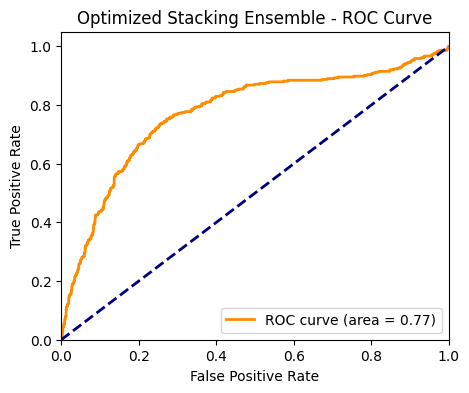

In [0]:

accuracy = accuracy_score(y_test_meta, y_pred)
f1 = f1_score(y_test_meta, y_pred)
cm = confusion_matrix(y_test_meta, y_pred)
fpr, tpr, _ = roc_curve(y_test_meta, y_pred_prob)
roc_auc_value = sk_auc(fpr, tpr)

print(f"✅ Optimized Stacking Ensemble - Accuracy: {accuracy:.4f}")
print(f"✅ Optimized Stacking Ensemble - F1-score: {f1:.4f}")
print("Confusion Matrix:\n", cm)

# =========================================
# 7️⃣ ROC Curve
# =========================================
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (area = {roc_auc_value:.2f})")
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Optimized Stacking Ensemble - ROC Curve")
plt.legend(loc="lower right")
plt.show()